# Clustering BERVO Terms

This notebook contains a process for co-clusting ontology terms based on metrics derived from large language model embeddings.

It specifically works with BERVO (https://github.com/bioepic-data/bervo) and the `trowel` package from this repository.

The process uses functions from the CurateGPT package (https://github.com/monarch-initiative/curategpt).

## Setup

Note that you will need to have an API key (e.g., for OpenAI).
That may be set as follows:

In [ ]:
%env OPENAI_API_KEY=your_openai_api_key_here

In [3]:
# Install dependencies
%pip install curategpt duckdb scipy


[notice] A new release of pip is available: 25.0.1 -> 25.3
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 25.0.1 -> 25.3
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [4]:
import requests

In [5]:
# Retrieve the ontology
SRC_URL = 'https://docs.google.com/spreadsheets/d/1mS8VVtr-m24vZ7nQUtUbQrN8r-UBy3AwRzTfQsmwVL8/export?exportFormat=csv'
resp = requests.get(SRC_URL, stream=True)
resp.raise_for_status()
with open('bervo-src.csv', 'wb') as f:
    for chunk in resp.iter_content(chunk_size=8192):
        if chunk:
            f.write(chunk)

In [6]:
# Retrieve the new terms
NEW_TERMS_URL = 'https://raw.githubusercontent.com/bioepic-data/trowel/refs/heads/main/data/essdive_flmd/results.tsv'
resp = requests.get(NEW_TERMS_URL, stream=True)
resp.raise_for_status()
with open('new-terms.csv', 'wb') as f:
    for chunk in resp.iter_content(chunk_size=8192):
        if chunk:
            f.write(chunk)

## Index the Terms

In [22]:
# Make a directory for the database
!mkdir db

mkdir: cannot create directory ‘db’: File exists


In [5]:
import csv

# Index BERVO first - just the identifiers, to start
# Make a version that's just IDs and terms first
with open('bervo-src.csv', newline='', encoding='utf-8') as infile, \
    open('bervo_terms_only.csv', 'w', newline='', encoding='utf-8') as outfile:
    reader = csv.reader(infile)
    writer = csv.writer(outfile)
    # skip header (equivalent to `tail -n +2`)
    try:
       next(reader)
    except StopIteration:
       pass
    for row in reader:
       # write the first two columns (equivalent to `cut -f1,2 -d,`)
       writer.writerow([row[0] if len(row) > 0 else '', row[1] if len(row) > 1 else ''])

In [6]:
!curategpt -vvv index -c bervo_terms_only -D duckdb --batch-size 100 bervo_terms_only.csv

2025-10-28 13:48:22.372043566 [W:onnxruntime:Default, device_discovery.cc:164 DiscoverDevicesForPlatform] GPU device discovery failed: device_discovery.cc:89 ReadFileContents Failed to open file: "/sys/class/drm/card0/device/vendor"
/home/harry/.cache/pypoetry/virtualenvs/trowel-E_YSPYsV-py3.12/lib/python3.12/site-packages/eutils/__init__.py:4: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
/home/harry/.cache/pypoetry/virtualenvs/trowel-E_YSPYsV-py3.12/lib/python3.12/site-packages/eutils/__init__.py:4: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
INFO:root

## Visualize Term Similarity

In [7]:
import numpy as np
from scipy.spatial import distance_matrix
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from matplotlib import pyplot as plt

In [8]:
# Connect to DuckDB and fetch all embeddings
import duckdb

conn = duckdb.connect('db/db_file.duckdb')

# Query all terms with their embeddings
# The collection name should match what we indexed
query = """
SELECT id, embeddings
FROM bervo_terms_only
WHERE id != '__venomx__'
ORDER BY id
"""

results = conn.execute(query).fetchall()
print(f"Fetched {len(results)} terms with embeddings")

Fetched 2079 terms with embeddings


In [9]:
# Write embeds to file
with open('bervo_embeds.csv', 'w') as f:
    for result in results:
        f.write(','.join([str(x) for x in result]) + '\n')

In [13]:
# Extract labels and vectors from the bervo_embeds.csv file
# Format: each line is metadata_dict,(embedding_values_tuple)
import ast

labels = []
vectors = []

with open('bervo_embeds.csv', 'r') as f:
    for line in f:
        line = line.strip()
        if not line:
            continue
            
        # The line format is: {'ID': '...', 'LABEL': '...'},(val1, val2, ...)
        # Find where the metadata dict ends
        dict_end = line.index('}') + 1
        
        # Extract metadata
        metadata_str = line[:dict_end]
        
        try:
            metadata = ast.literal_eval(metadata_str)
            label = metadata.get('LABEL', metadata.get('ID', 'Unknown'))
        except Exception as e:
            print(f"Error parsing metadata: {e}")
            continue
        
        # Extract embedding values - everything after the dict and comma
        # Format: ,(val1, val2, ...)
        embedding_str = line[dict_end+1:]  # Skip the comma after }
        
        try:
            embedding_tuple = ast.literal_eval(embedding_str)
            embedding_values = list(embedding_tuple)
        except Exception as e:
            print(f"Error parsing embeddings for {label}: {e}")
            continue
        
        labels.append(label)
        vectors.append(np.array(embedding_values))

print(f"Prepared {len(labels)} terms for visualization")
print(f"Embedding dimension: {len(vectors[0]) if vectors else 'N/A'}")

Prepared 2079 terms for visualization
Embedding dimension: 1536


In [14]:
# Compute pairwise distance matrix
# This calculates the Euclidean distance between all pairs of embedding vectors
vectors_array = np.array(vectors)
distances = distance_matrix(vectors_array, vectors_array)

print(f"Distance matrix shape: {distances.shape}")
print(f"Distance matrix stats - min: {distances.min():.4f}, max: {distances.max():.4f}, mean: {distances.mean():.4f}")

Distance matrix shape: (2079, 2079)
Distance matrix stats - min: 0.0000, max: 0.7660, mean: 0.5947


In [25]:
# Function to visualize clusters using dimensionality reduction
# Adapted from curategpt.app.components.vectors_to_fig

def visualize_term_clusters(labels, vectors, method='PCA', figsize=(12, 10)):
    """
    Visualize term clusters using dimensionality reduction.
    
    Args:
        labels: List of term labels
        vectors: Array of embedding vectors
        method: Dimensionality reduction method ('PCA', 't-SNE', or 'UMAP')
        figsize: Size of the figure
    
    Returns:
        Matplotlib figure
    """
    if method == 'PCA':
        reducer = PCA(n_components=2)
    elif method == 't-SNE':
        n_samples = len(vectors)
        perplexity_value = min(n_samples - 1, 30)  # Default is 30, but should be less than number of samples
        reducer = TSNE(n_components=2, perplexity=perplexity_value, random_state=42)
    elif method == 'UMAP':
        try:
            import umap
            reducer = umap.UMAP(random_state=42)
        except ImportError:
            print("UMAP not installed. Install with: pip install umap-learn")
            return None
    else:
        raise ValueError(f"Unknown method {method}")
    
    # Reduce to 2D
    reduced_data = reducer.fit_transform(vectors)
    
    # Create plot
    fig, ax = plt.subplots(figsize=figsize)
    ax.scatter(reduced_data[:, 0], reduced_data[:, 1], s=50, alpha=0.6)
    
    # Add labels to points
    # for i, label in enumerate(labels):
    #     ax.annotate(label, (reduced_data[i, 0], reduced_data[i, 1]), 
    #                fontsize=9, ha='right', alpha=0.7)
    
    ax.set_title(f'Term Clustering using {method}')
    ax.set_xlabel('Component 1')
    ax.set_ylabel('Component 2')
    plt.tight_layout()
    
    return fig

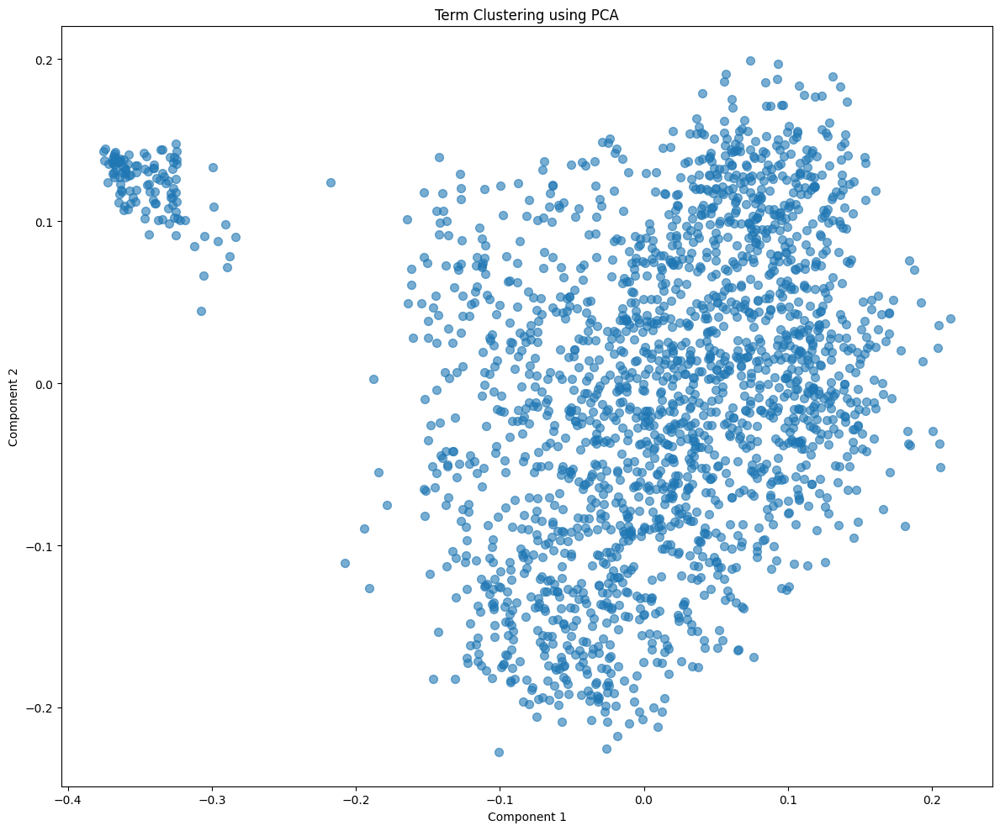

In [26]:
# Visualize using PCA
fig_pca = visualize_term_clusters(labels, vectors_array, method='PCA')
plt.show()

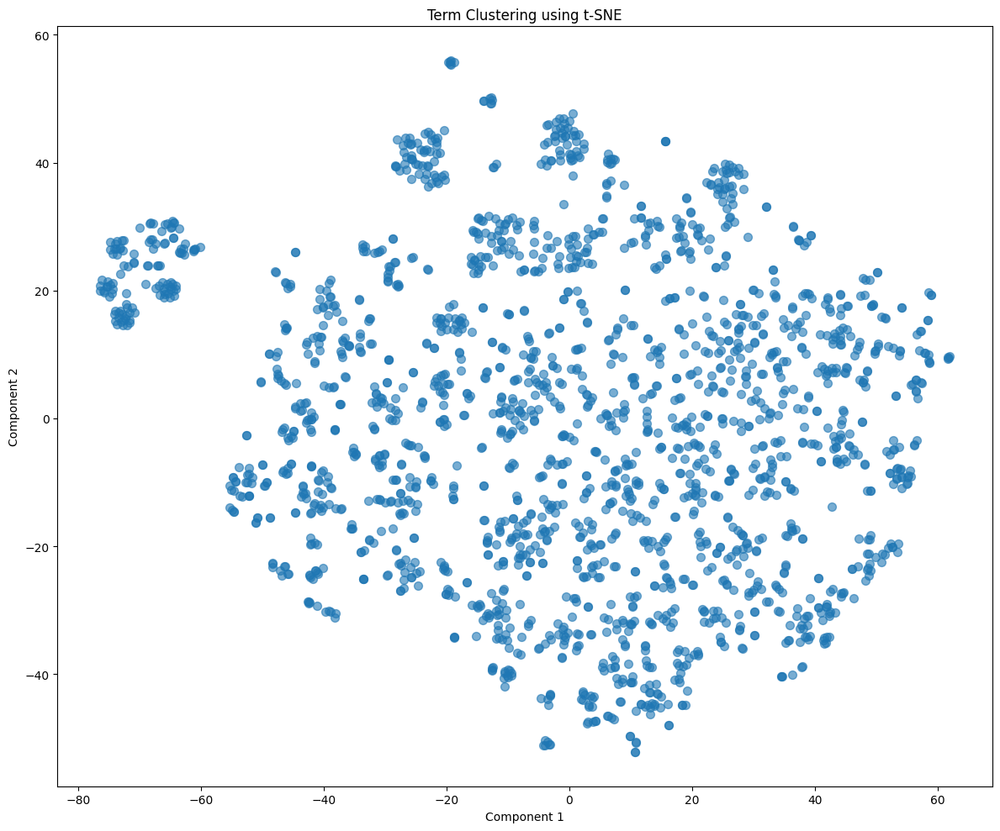

In [27]:
# Visualize using t-SNE (more computationally intensive but often better at preserving local structure)
fig_tsne = visualize_term_clusters(labels, vectors_array, method='t-SNE')
plt.show()

## Find Similar Terms

Now let's find the most similar terms for a given query term using cosine similarity.

In [28]:
# Function to compute cosine similarity between vectors
def compute_cosine_similarity(list1, list2):
    """
    Compute cosine similarity between two lists of vectors.

    Result is a matrix sim[ROW][COL] where ROW is from list1 and COL is from list2.
    """
    # Convert lists to numpy arrays
    matrix1 = np.array(list1)
    matrix2 = np.array(list2)

    # Normalize the vectors in both matrices
    matrix1_norm = matrix1 / np.linalg.norm(matrix1, axis=1)[:, np.newaxis]
    matrix2_norm = matrix2 / np.linalg.norm(matrix2, axis=1)[:, np.newaxis]

    # Compute dot products (resulting in cosine similarity values)
    cosine_similarity_matrix = np.dot(matrix1_norm, matrix2_norm.T)

    return cosine_similarity_matrix


# Compute cosine similarity for all term pairs
similarity_matrix = compute_cosine_similarity(vectors, vectors)

print(f"Similarity matrix shape: {similarity_matrix.shape}")
print(
    f"Similarity matrix stats - min: {similarity_matrix.min():.4f}, max: {similarity_matrix.max():.4f}, mean: {similarity_matrix.mean():.4f}")

Similarity matrix shape: (2079, 2079)
Similarity matrix stats - min: 0.7066, max: 1.0000, mean: 0.8217


In [29]:
# Function to find the top N most similar terms to a query term
def find_similar_terms(query_term, labels, similarity_matrix, top_n=10):
    """
    Find the top N most similar terms to the query term.

    Args:
        query_term: The term to find similar terms for
        labels: List of all term labels
        similarity_matrix: Precomputed cosine similarity matrix
        top_n: Number of top similar terms to return

    Returns:
        List of tuples (term, similarity_score)
    """
    if query_term not in labels:
        print(f"Term '{query_term}' not found in the collection.")
        return []

    # Find the index of the query term
    query_idx = labels.index(query_term)

    # Get similarities for this term
    similarities = similarity_matrix[query_idx]

    # Get indices of top N similar terms (excluding the query term itself)
    top_indices = np.argsort(-similarities)[1:top_n+1]  # Skip first (itself)

    # Create results
    results = [(labels[idx], similarities[idx]) for idx in top_indices]

    return results


# Example: Find similar terms to a specific term
# You can change this to any term in the ontology
example_term = "Total nutrient exchange"
print(f"\nTop 10 terms most similar to '{example_term}':")
print("-" * 60)
similar = find_similar_terms(example_term, labels, similarity_matrix, top_n=10)
for i, (term, score) in enumerate(similar, 1):
    print(f"{i:2d}. {term:40s} (similarity: {score:.4f})")


Top 10 terms most similar to 'Total nutrient exchange':
------------------------------------------------------------
 1. Net microbial nitrogen exchange          (similarity: 0.9316)
 2. Net exchange                             (similarity: 0.9196)
 3. Total root element exchange              (similarity: 0.9144)
 4. Nutrient                                 (similarity: 0.9129)
 5. Total net canopy carbon dioxide exchange (similarity: 0.9115)
 6. Net ecosystem carbon dioxide exchange    (similarity: 0.9115)
 7. Total solute nutrient transformation band (similarity: 0.9097)
 8. Total surface nitrogen flux              (similarity: 0.9065)
 9. Total surface dissolved organic nitrogen flux (similarity: 0.9005)
10. Total root uptake of nitrate             (similarity: 0.8996)


## Interactive Exploration

You can now explore similar terms by changing the `example_term` variable above. Or use the function interactively:

```python
# Example: Find terms similar to "temperature"
similar = find_similar_terms("temperature", labels, similarity_matrix, top_n=10)
for term, score in similar:
    print(f"{term}: {score:.4f}")
```

## Heatmap Visualization

Visualize the similarity matrix as a heatmap for a subset of terms to see clustering patterns.

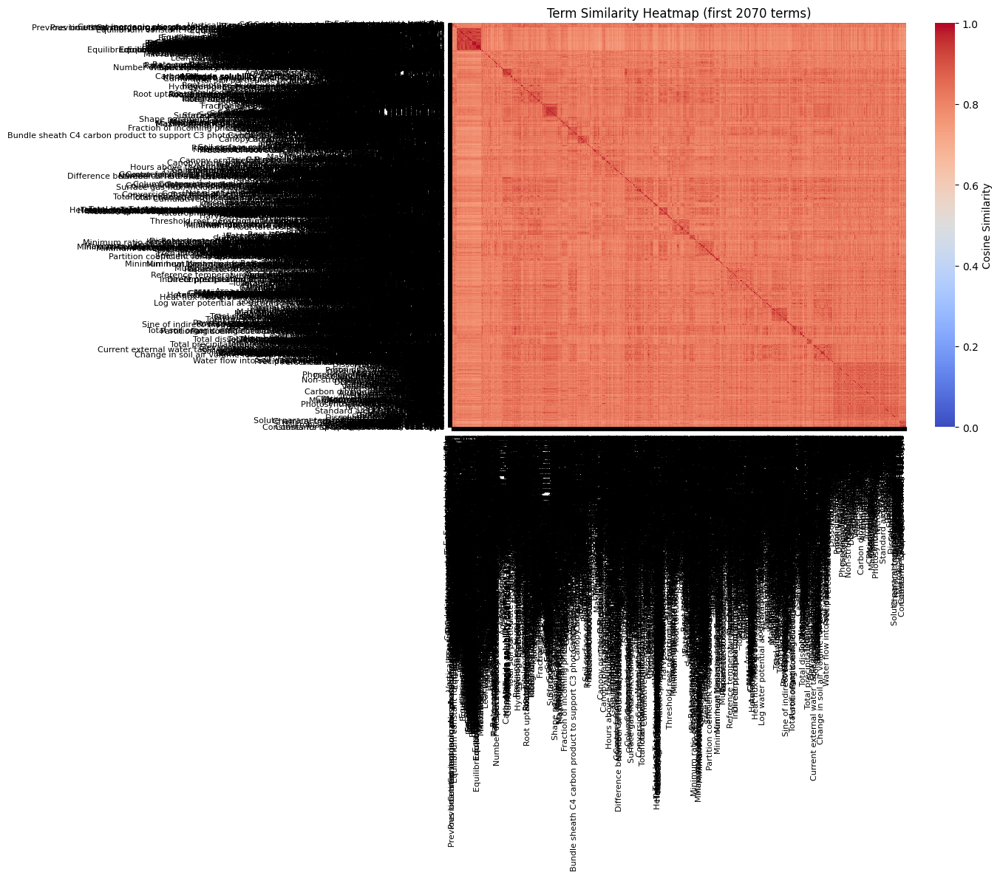

In [ ]:
import seaborn as sns

def plot_similarity_heatmap(labels, similarity_matrix, num_terms=50, figsize=(100, 100)):
    """
    Plot a heatmap of the similarity matrix for a subset of terms.
    
    Args:
        labels: List of term labels
        similarity_matrix: Precomputed cosine similarity matrix
        num_terms: Number of terms to include in the heatmap (default: 50)
        figsize: Size of the figure
    """
    # Select a subset of terms (first num_terms)
    subset_labels = labels[:num_terms]
    subset_matrix = similarity_matrix[:num_terms, :num_terms]
    
    # Create heatmap
    fig, ax = plt.subplots(figsize=figsize)
    sns.heatmap(subset_matrix, 
                xticklabels=subset_labels,
                yticklabels=subset_labels,
                cmap='coolwarm',
                center=0.5,
                vmin=0,
                vmax=1,
                ax=ax,
                cbar_kws={'label': 'Cosine Similarity'})
    
    plt.xticks(rotation=90, ha='right', fontsize=8)
    plt.yticks(rotation=0, fontsize=8)
    plt.title(f'Term Similarity Heatmap (first {num_terms} terms)')
    plt.tight_layout()
    
    return fig

# Create heatmap for all terms
fig_heatmap = plot_similarity_heatmap(labels, similarity_matrix, num_terms=2070)
plt.show()